# Stem Separation - Tutorial

**Reference**: Using "Open Source Tools & Data for Music Source Separation" by Ethan Manilow, Prem Seetharaman, and Justin Salamon

This is our initial exploration for stem separation methods using the `nussl` and `torch` python libraries. None of this is directly used for our project, but we felt it was important to include given its relevance in establishing the foundation of our resulting model.

## Initial Setup

In [ ]:
%pip install nussl
%pip install git+https://github.com/source-separation/tutorial

In [19]:
import IPython
from IPython.display import Audio

import nussl
from nussl.ml.networks.modules import AmplitudeToDB

import numpy as np
import matplotlib.pyplot as plt
import torch

In [20]:
nussl.utils.seed(0)
to_numpy = lambda x: x.detach().numpy()
to_tensor = lambda x: torch.from_numpy(x).reshape(-1, 1).float()

## Loading in the Dataset

In [21]:
musdb = nussl.datasets.MUSDB18(download=True)

In [22]:
musdb_train = nussl.datasets.MUSDB18(subsets=['train'])
print(musdb_train.items)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]


In [23]:
idx = 0
item = musdb_train[idx]

print(f"Training Dataset Item Keys: {item.keys()}\n")
print(f"Training Dataset Item Mix: {item['mix']}")
print(f"Training Dataset Item Sources: {item['sources'].keys()}")
print(f"Training Dataset Item Metadata: {item['metadata']}")

Training Dataset Item Keys: dict_keys(['mix', 'sources', 'metadata'])

Training Dataset Item Mix: AudioSignal (unlabeled): 6.803 sec @ A Classic Education - NightOwl, 44100 Hz, 2 ch.
Training Dataset Item Sources: dict_keys(['drums', 'bass', 'other', 'vocals'])
Training Dataset Item Metadata: {'labels': ['bass', 'drums', 'other', 'vocals']}


In [24]:
print('mixture')
IPython.display.display(Audio(data=item['mix'].audio_data, rate=item['mix'].sample_rate))

for stem_label in item['sources'].keys():
    print(stem_label)
    audio_player = Audio(data=item['sources'][stem_label].audio_data, rate=item['sources'][stem_label].sample_rate)
    IPython.display.display(audio_player)

mixture


drums


bass


other


vocals


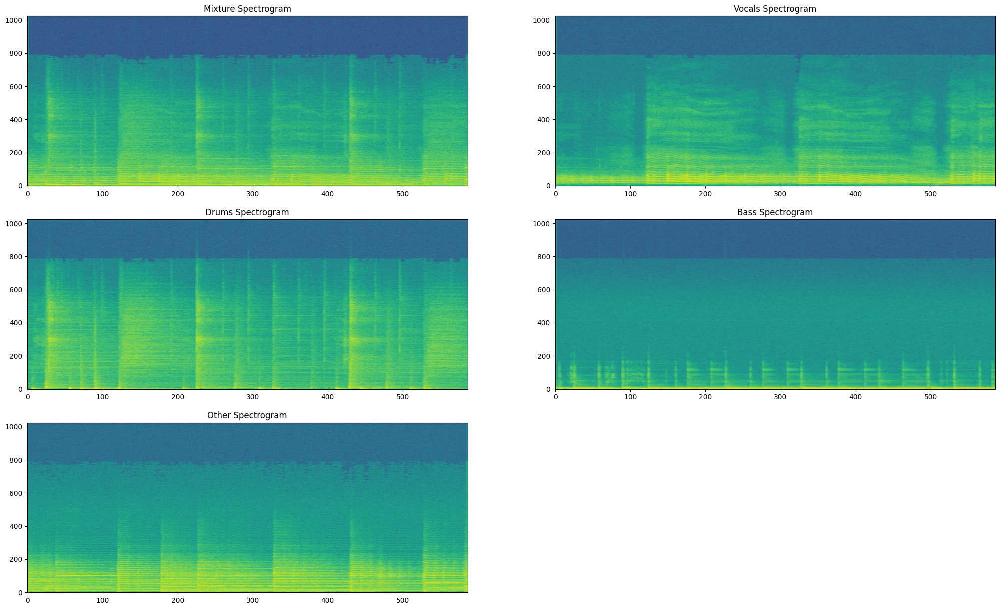

In [25]:
representation = np.abs(item['mix'].stft())
vocals_representation = np.abs(item['sources']['vocals'].stft())
drums_representation = np.abs(item['sources']['drums'].stft())
bass_representation = np.abs(item['sources']['bass'].stft())
other_representation = np.abs(item['sources']['other'].stft())

fig, ax = plt.subplots(3, 2, figsize=(25, 15))

ax[0][0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0][0].set_title('Mixture Spectrogram')
ax[0][1].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[0][1].set_title('Vocals Spectrogram')
ax[1][0].imshow(20 * np.log10(drums_representation[..., 0]), origin='lower', aspect='auto')
ax[1][0].set_title('Drums Spectrogram')
ax[1][1].imshow(20 * np.log10(bass_representation[..., 0]), origin='lower', aspect='auto')
ax[1][1].set_title('Bass Spectrogram')
ax[2][0].imshow(20 * np.log10(other_representation[..., 0]), origin='lower', aspect='auto')
ax[2][0].set_title('Other Spectrogram')
ax[2][1].set_visible(False)

plt.show()

## Masking

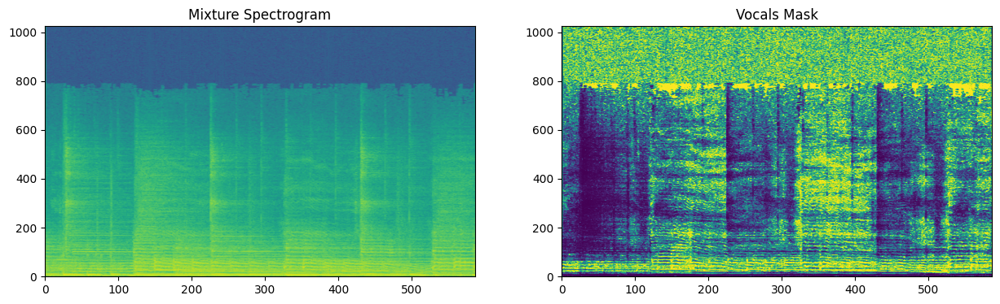

In [26]:
mask = vocals_representation / (np.maximum(vocals_representation, representation) + 1e-8)

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture Spectrogram')
ax[1].imshow(mask[..., 0], origin='lower', aspect='auto')
ax[1].set_title('Vocals Mask')

plt.show()

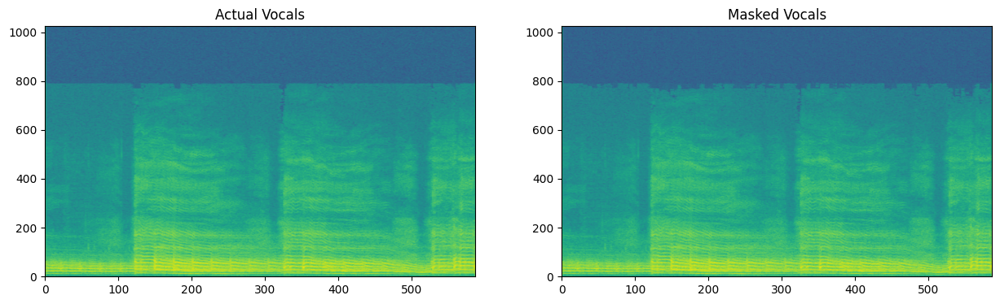

In [27]:
masked = mask * representation

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Actual Vocals')
ax[1].imshow(20 * np.log10(masked[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('Masked Vocals')

plt.show()

In [28]:
mix_phase = np.angle(item['mix'].stft())
masked_stft = masked * np.exp(1j * mix_phase)
new_signal = nussl.AudioSignal(stft=masked_stft, sample_rate=item['mix'].sample_rate)
new_signal.istft()
new_signal.embed_audio(display=False)

ffmpeg version 7.1 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 16.0.0 (clang-1600.0.26.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --e

In [29]:
mix_tensor = torch.tensor(representation)
mask_tensor = torch.rand_like(mix_tensor.unsqueeze(-1))

# shapes
print(mix_tensor.shape, mask_tensor.shape)

# masking operation:
masked_tensor = mix_tensor.unsqueeze(-1) * mask_tensor

print(masked_tensor.shape)

torch.Size([1025, 587, 2]) torch.Size([1025, 587, 2, 1])
torch.Size([1025, 587, 2, 1])


In [30]:
print("Shape before (nf, nt, nac): ", mix_tensor.shape)
mix_tensor = mix_tensor.permute(1, 0, 2).unsqueeze(0).float()
print("Shape after (nb, nt, nf, nac):", mix_tensor.shape)

Shape before (nf, nt, nac):  torch.Size([1025, 587, 2])
Shape after (nb, nt, nf, nac): torch.Size([1, 587, 1025, 2])


## Log-Magnitude Representation

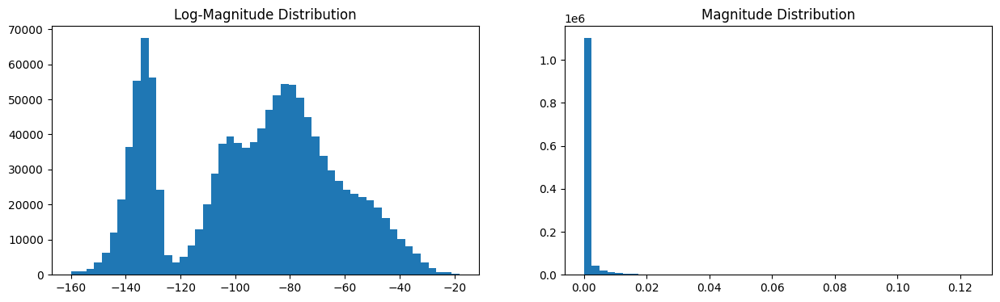

In [31]:
fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].hist(20 * np.log10(np.maximum(representation, 1e-8)).flatten(), bins=50)
ax[0].set_title('Log-Magnitude Distribution')
ax[1].hist(representation.flatten(), bins=50)
ax[1].set_title('Magnitude Distribution')

plt.show()

In [32]:
amplitude_to_db = AmplitudeToDB()
mix_log_amplitude = amplitude_to_db(mix_tensor)
print(mix_tensor.mean(), mix_log_amplitude.mean())

tensor(0.0010) tensor(-73.7175)


## Input Normalization

In [33]:
from nussl.ml.networks.modules import BatchNorm

def print_stats(data):
    print(
        f"Shape: {data.shape}\n"
        f"Mean: {data.mean().item()}\n"
        f"Var: {data.var().item()}\n"
    )

input_normalization = BatchNorm(num_features=mix_tensor.shape[2])
mix_log_amplitude = amplitude_to_db(mix_tensor)

print("BEFORE NORMALIZATION")
print_stats(mix_log_amplitude)

normalized = input_normalization(mix_log_amplitude)

print("AFTER NORMALIZATION")
print_stats(normalized)

BEFORE NORMALIZATION
Shape: torch.Size([1, 587, 1025, 2])
Mean: -73.71746063232422
Var: 131.1121368408203

AFTER NORMALIZATION
Shape: torch.Size([1, 587, 1025, 2])
Mean: 6.637861815761426e-07
Var: 0.6813965439796448



## Recurrent Processing

In [34]:
from nussl.ml.networks.modules import RecurrentStack

nb, nt, nf, nac = mix_tensor.shape
recurrent_stack = RecurrentStack(
    nf * nac, 
    hidden_size=50, 
    num_layers=2, 
    bidirectional=True, 
    dropout=0.3
)

output = recurrent_stack(normalized)
print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 587, 1025, 2])
Mean: 0.0009880828438326716
Var: 1.7966554878512397e-05

Shape: torch.Size([1, 587, 100])
Mean: 0.003553329734131694
Var: 0.12542325258255005

